In [2]:
data = """p=0,4 v=3,-3
p=6,3 v=-1,-3
p=10,3 v=-1,2
p=2,0 v=2,-1
p=0,0 v=1,3
p=3,0 v=-2,-2
p=7,6 v=-1,-3
p=3,0 v=-1,-2
p=9,3 v=2,3
p=7,3 v=-1,2
p=2,4 v=2,-3
p=9,5 v=-3,-3"""

from pathlib import Path
data = Path('2024-14.txt').read_text()
import re

robots = [tuple(int(x) for x in re.findall(r'-?\d+', l)) for l in data.splitlines()]

In [3]:
robots

[(1, 65, -5, -84),
 (14, 63, -85, 6),
 (49, 81, 71, 14),
 (61, 77, 85, 67),
 (58, 37, 42, 47),
 (99, 13, -4, -72),
 (50, 29, 58, 96),
 (84, 63, -93, -25),
 (77, 90, -3, -70),
 (11, 82, -74, 54),
 (94, 3, 16, -96),
 (30, 86, -29, 96),
 (31, 92, -70, 97),
 (58, 99, 16, -89),
 (14, 99, 45, 36),
 (42, 25, -93, -16),
 (25, 68, 37, 61),
 (55, 100, 4, -98),
 (34, 95, -41, 53),
 (40, 86, 37, -73),
 (55, 7, 50, -63),
 (76, 19, 30, -75),
 (98, 73, 55, -4),
 (92, 0, 37, -67),
 (66, 75, 98, -43),
 (96, 54, 14, -38),
 (74, 16, 26, -88),
 (37, 36, 72, -32),
 (59, 95, 34, 91),
 (28, 102, 5, 44),
 (46, 21, -94, 76),
 (51, 34, -66, -66),
 (93, 99, -40, 70),
 (2, 79, -18, 9),
 (0, 12, 81, 20),
 (85, 25, -68, -77),
 (7, 81, 31, -28),
 (43, 29, -68, -74),
 (45, 33, 15, 50),
 (20, 66, -57, 38),
 (13, 52, -55, 35),
 (17, 6, -47, -35),
 (31, 93, 80, 99),
 (33, 49, -86, 8),
 (64, 41, 63, -16),
 (57, 11, -45, 80),
 (62, 6, -96, -84),
 (35, 2, 71, -26),
 (36, 51, 95, -39),
 (88, 3, 90, 57),
 (17, 16, 12, -82),


In [4]:
from math import prod

In [5]:
def aftern(robots, n, W=101,H=103):
    acc =[]
    for r in robots:
        a,b,v,w = r
        acc.append( (  (a+n*v) % W, (b+n*w)%H ) )
    return list(sorted(acc))

res = aftern(robots, 100, 101,103)

def quadrants(pos, W=101,H=1-3):
    a,b,c,d,m = [],[],[],[],[]
    for x,y in pos:
        if x < W//2 and y < H //2:
            a.append((x,y))
        elif x < W//2 and y >= H //2+1:
            b.append((x,y))
        elif x >= W//2+1 and y < H //2:
            c.append((x,y))
        elif x >= W//2+1 and y >= H //2+1:
            d.append((x,y))
        else:
            m.append((x,y))
    return a,b,c,d#,m
        
prod([len(x) for x in quadrants(res, 101,103)]) # 92551680 too low

224969976

In [70]:
res = aftern(robots, 100, 11,7)
for j in range(7):
    if j == 3:
        print()
        continue
    for i in range(11):
        if i == 5:
            print('      ', end='')
        elif (i,j) in res:
            print((i,j), end='')
        else:
            print(' ____ ', end='')
    print()
        

 ____  ____  ____  ____  ____       (6, 0) ____  ____ (9, 0) ____ 
 ____  ____  ____  ____  ____        ____  ____  ____  ____  ____ 
(0, 2) ____  ____  ____  ____        ____  ____  ____  ____  ____ 

 ____  ____  ____  ____  ____        ____  ____  ____  ____  ____ 
 ____  ____  ____ (3, 5)(4, 5)       ____  ____  ____  ____  ____ 
 ____ (1, 6) ____  ____  ____       (6, 6) ____  ____  ____  ____ 


In [6]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

In [7]:
!mkdir tree

mkdir: tree: File exists


/var/folders/7x/x6hsdv257b3_ml15w4czp2rc0000gn/T/ipykernel_10911/1642327419.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


>>> 7892


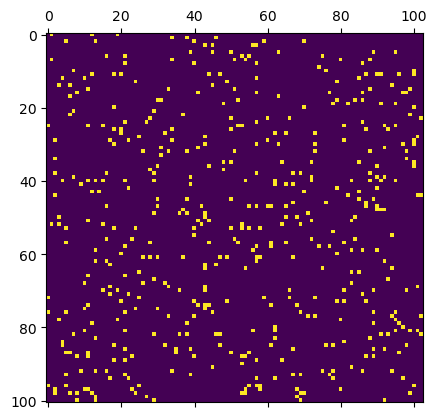

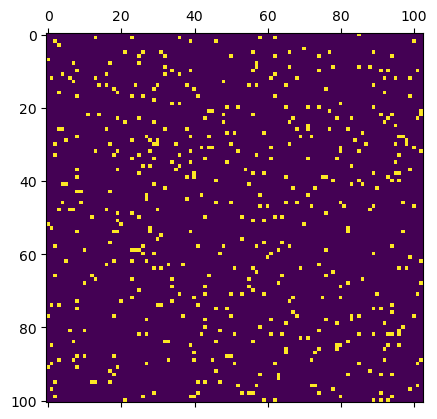

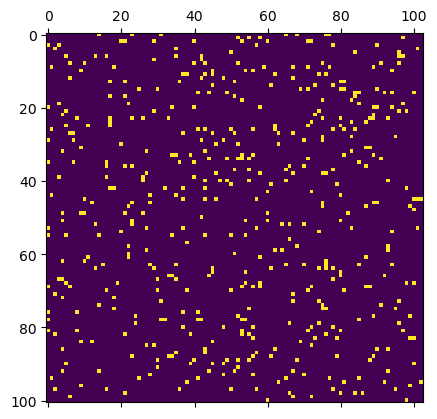

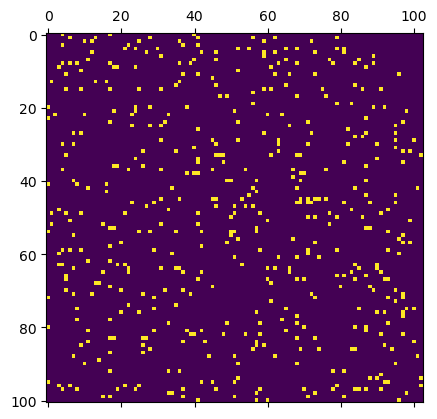

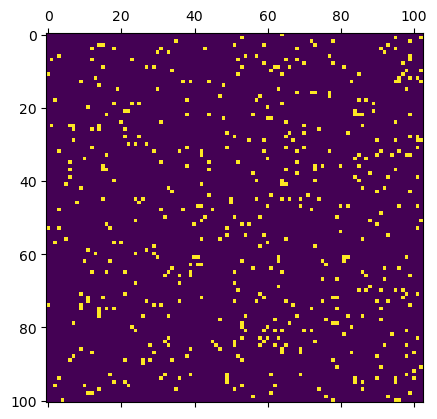

...

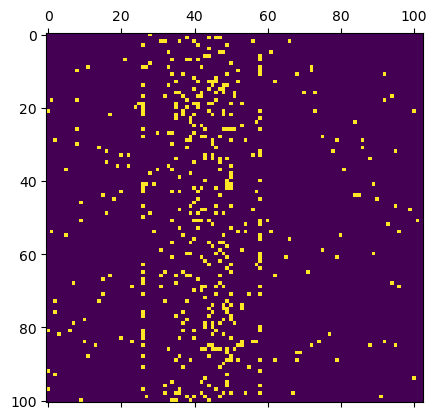

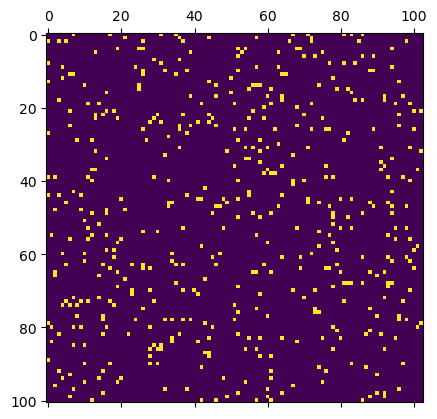

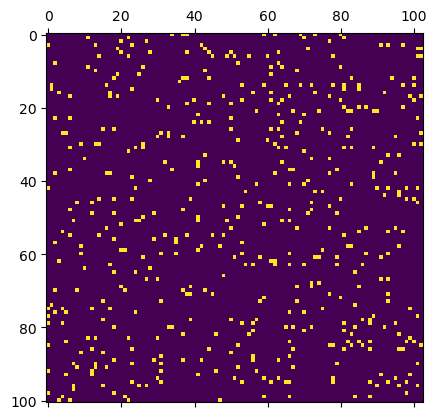

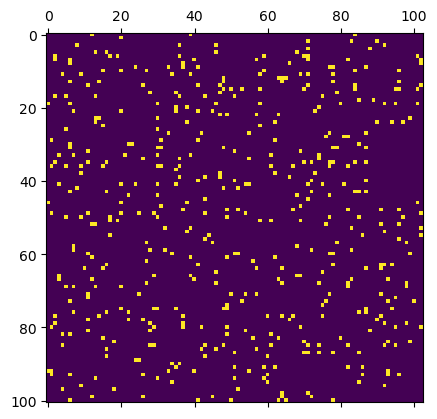

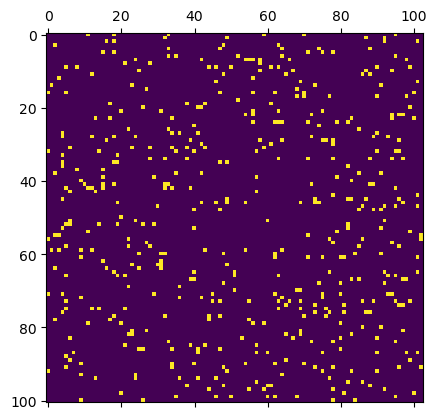

In [9]:
for k in range(7000, 8000):
    grid = np.zeros((101, 103))
    res = aftern(robots, k, 101, 103)
    c = Counter(res)
    for kk,v in c.items():
        grid[*kk] = 1
    #print(min(c.values()), max(c.values()))
    if max(c.values()) == 1:
        print('>>>', k)
    fig, ax = plt.subplots()
    ax.matshow(grid, vmin=0, vmax=1)
    fig.savefig(f'tree/tree-{k}.png')
# 64    
# 115 (51)
# 167 (52)
# 216 (49)
# 270 (54)
# 317 (47)


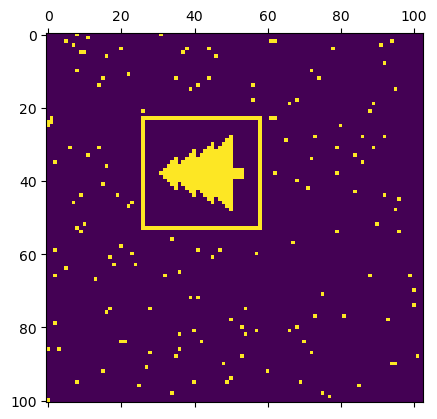

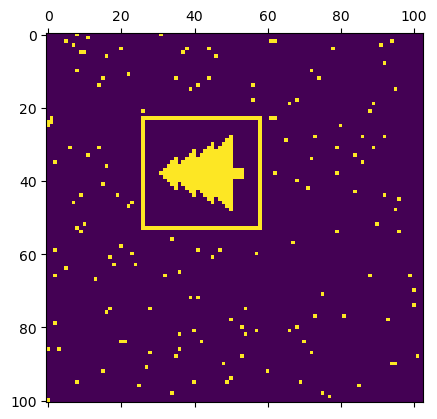

In [11]:
grid = np.zeros((101, 103))
res = aftern(robots, 7892, 101, 103)
c = Counter(res)
for kk,v in c.items():
    grid[*kk] = v

fig, ax = plt.subplots()
ax.matshow(grid, vmin=0, vmax=1)
fig

In [107]:
len(robots)  #369, 949

500

In [108]:
101*103

10403

In [66]:
11//2

5

In [24]:
101//2 + 2

52

In [23]:
3//2

1

In [38]:
aftern([(2,4,2,-3)], 5, 11,7) # 2,4 - 4,1 – 6,5 – 8,2 – 10, 6 – 

[(1, 3)]